In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from keras import optimizers
from sklearn.metrics import mean_squared_error

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [4]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [5]:
def plot_curve(history):
    print('Last train loss: %s'%history.history['loss'][-1])
    print('Last validation loss: %s'%history.history['val_loss'][-1])
    
    print('Last train accuracy: %s'%history.history['accuracy'][-1])
    print('Last validation accuracy: %s'%history.history['val_accuracy'][-1])
    # loss curves
    fig, axs = plt.subplots(1,2,figsize=(15,4))

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    
    epochs = range(1, len(loss) + 1)

    # Plot loss
    loss_plot = axs[0]
    
    loss_plot.plot(epochs, loss, 'c--', label='Training loss')
    loss_plot.plot(epochs, val_loss, 'b', label='Validation loss')
    loss_plot.set_title('Training and validation loss')
    loss_plot.set_xlabel('Epochs')
    loss_plot.set_ylabel('Loss')
    loss_plot.legend()
    
    # Plot accuracy
    acc_plot = axs[1]
    
    acc_plot.plot(epochs, acc, 'c--', label='Training acc')
    acc_plot.plot(epochs, val_acc, 'b', label='Validation acc')
    acc_plot.set_title('Training and validation accuracy')
    acc_plot.set_xlabel('Epochs')
    acc_plot.set_ylabel('Accuracy')
    acc_plot.legend()


In [6]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [7]:
cloud_cover = preparedata('../succeed-prophet/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


# Train/Test Model ,lags = 1

In [8]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,1)

X_train Shape : (14767, 1, 1)
y_train Shape : (14767, 1)
X_test Shape :  (293, 1, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [9]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### Add frist layer: units = 50

In [10]:
test1 = test.copy()

In [11]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 6ms/step - loss: 0.0446 - accuracy: 0.0077 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0011377143673598766
Last validation loss: 0.0017961442936211824
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


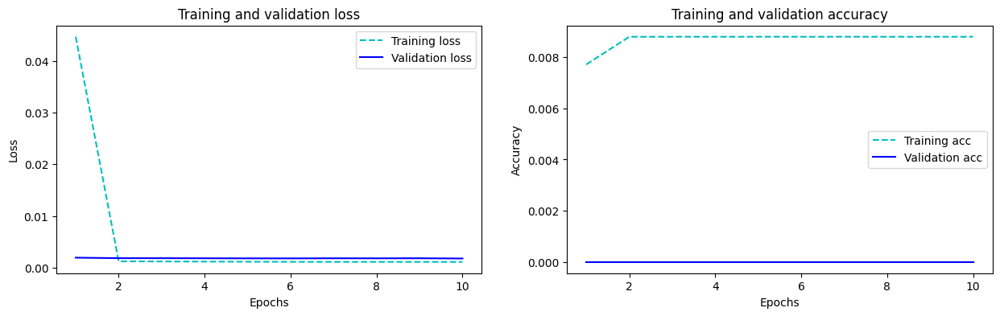

In [12]:
plot_curve(hist_adam)

In [13]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.326649
1,2021-12-16 09:11:00,0.112,0.114095
2,2021-12-16 09:12:00,0.116,0.115065
3,2021-12-16 09:13:00,0.112,0.118946
4,2021-12-16 09:14:00,0.099,0.115065
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542
289,2021-12-16 13:59:00,0.169,0.169542
290,2021-12-16 14:00:00,0.147,0.170517
291,2021-12-16 14:01:00,0.145,0.149077


In [122]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [15]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0017871748422507152

In [16]:
mse_data = pd.DataFrame(columns=['LSTM lag1'])
mse_error_unit_50_adam = [lstm_mse_error_unit_50_adam]
mse_data.loc['Lstm mse error unit 50 adam'] = mse_error_unit_50_adam
mse_data

,LSTM lag1
Lstm mse error unit 50 adam,0.001787


----------------------------------------------------------------------------------

## optimizer sgd

### Add frist layer: units = 50

In [17]:
model_50_sgd = Sequential()
model_50_sgd.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_sgd.add(Dense(units = 1))
model_50_sgd.compile(optimizer = 'sgd', loss = 'mean_squared_error', metrics=['accuracy'])
hist_50_sgd = model_50_sgd.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 6ms/step - loss: 0.1062 - accuracy: 0.0068 - val_loss: 0.0669 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0648 - accuracy: 0.0088 - val_loss: 0.0442 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0406 - accuracy: 0.0088 - val_loss: 0.0287 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0227 - accuracy: 0.0088 - val_loss: 0.0146 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0116 - accuracy: 0.0088 - val_loss: 0.0079 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0056 - accuracy: 0.0088 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0025 - val

Last train loss: 0.0012159222969785333
Last validation loss: 0.0018200066406279802
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


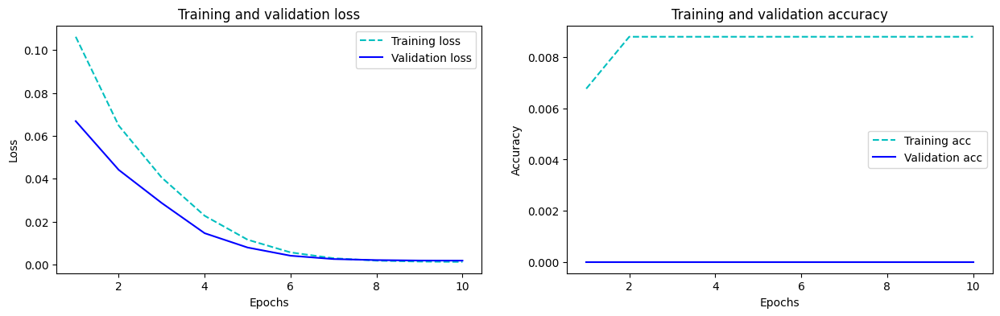

In [18]:
plot_curve(hist_50_sgd)

In [19]:
predict_scaled_50_sgd = model_50_sgd.predict(X_test)
predict_50_sgd = sc.inverse_transform(predict_scaled_50_sgd)
test1['LSTM_50_sgd'] = predict_50_sgd
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd
0,2021-12-16 09:10:00,0.111,0.326649,0.333875
1,2021-12-16 09:11:00,0.112,0.114095,0.118730
2,2021-12-16 09:12:00,0.116,0.115065,0.119717
3,2021-12-16 09:13:00,0.112,0.118946,0.123663
4,2021-12-16 09:14:00,0.099,0.115065,0.119717
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.175065
289,2021-12-16 13:59:00,0.169,0.169542,0.175065
290,2021-12-16 14:00:00,0.147,0.170517,0.176055
291,2021-12-16 14:01:00,0.145,0.149077,0.154287


In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_sgd'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [21]:
lstm_mse_error_unit_50_sgd = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_sgd'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_sgd)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001811


In [22]:
mse_error_unit_50_sgd = [lstm_mse_error_unit_50_sgd]
mse_data.loc['Lstm mse error unit 50 sgd'] = mse_error_unit_50_sgd

----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50

In [23]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error', metrics=['accuracy'])
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 5ms/step - loss: 0.0388 - accuracy: 0.0077 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0011534695513546467
Last validation loss: 0.0018275042530149221
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


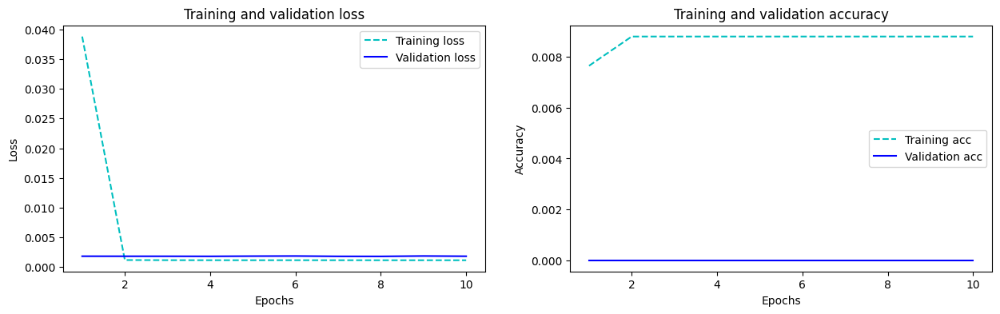

In [24]:
plot_curve(hist_50_rms)

In [25]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.326649,0.333875,0.330366
1,2021-12-16 09:11:00,0.112,0.114095,0.118730,0.113659
2,2021-12-16 09:12:00,0.116,0.115065,0.119717,0.114650
3,2021-12-16 09:13:00,0.112,0.118946,0.123663,0.118616
4,2021-12-16 09:14:00,0.099,0.115065,0.119717,0.114650
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.175065,0.170287
289,2021-12-16 13:59:00,0.169,0.169542,0.175065,0.170287
290,2021-12-16 14:00:00,0.147,0.170517,0.176055,0.171283
291,2021-12-16 14:01:00,0.145,0.149077,0.154287,0.149395


In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [27]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001818


In [28]:
mse_error_unit_50_rms = [lstm_mse_error_unit_50_rms]
mse_data.loc['Lstm mse error unit 50 rmsprop'] = mse_error_unit_50_rms

----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [29]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 5s 6ms/step - loss: 0.0820 - accuracy: 0.0062 - val_loss: 0.0176 - val_accuracy: 0.0000e+00
Epoch 2/10
231/231 [==============================] - 1s 4ms/step - loss: 0.0043 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
231/231 [==============================] - 1s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
231/231 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
231/231 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
231/231 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
231/231 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0011484355200082064
Last validation loss: 0.00182254402898252
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


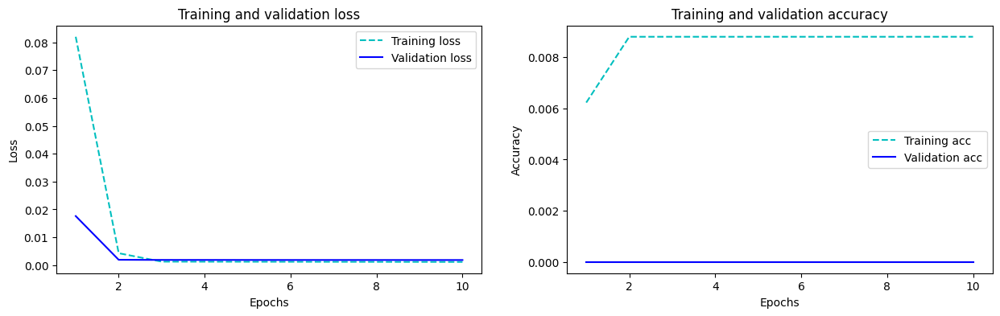

In [30]:
plot_curve(hist_batch_size64)

In [31]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.326649,0.333875,0.330366,0.324411
1,2021-12-16 09:11:00,0.112,0.114095,0.118730,0.113659,0.117046
2,2021-12-16 09:12:00,0.116,0.115065,0.119717,0.114650,0.117982
3,2021-12-16 09:13:00,0.112,0.118946,0.123663,0.118616,0.121728
4,2021-12-16 09:14:00,0.099,0.115065,0.119717,0.114650,0.117982
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.175065,0.170287,0.170701
289,2021-12-16 13:59:00,0.169,0.169542,0.175065,0.170287,0.170701
290,2021-12-16 14:00:00,0.147,0.170517,0.176055,0.171283,0.171647
291,2021-12-16 14:01:00,0.145,0.149077,0.154287,0.149395,0.150861


In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [33]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001813


In [34]:
mse_error_batch_size64 = [lstm_mse_error_batch_size64]
mse_data.loc['Lstm mse error batch_size64'] = mse_error_batch_size64

---

### learning rate 0.1

In [35]:
test2 = test.copy()

### Add frist layer: units = 50

In [36]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error', metrics=['accuracy'])
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 6ms/step - loss: 0.0046 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0043 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0025 - val

Last train loss: 0.00163484294898808
Last validation loss: 0.002120598452165723
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


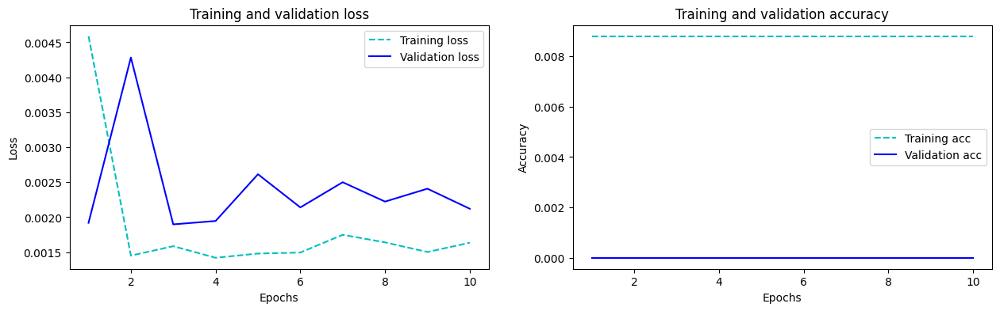

In [37]:
plot_curve(hist_01)

In [38]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.339487
1,2021-12-16 09:11:00,0.112,0.131673
2,2021-12-16 09:12:00,0.116,0.132701
3,2021-12-16 09:13:00,0.112,0.136802
4,2021-12-16 09:14:00,0.099,0.132701
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188684
289,2021-12-16 13:59:00,0.169,0.188684
290,2021-12-16 14:00:00,0.147,0.189659
291,2021-12-16 14:01:00,0.145,0.168025


In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [40]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.002110


In [41]:
mse_error_unit_50_01 = [lstm_mse_error_unit_50_01]
mse_data.loc['Lstm mse error learning rate 0.1'] = mse_error_unit_50_01

----------------------------------------------------------------------------------

### lr 0.05

### Add frist layer: units = 50

In [42]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error', metrics=['accuracy'])
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 5ms/step - loss: 0.0040 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val

Last train loss: 0.0013750980142503977
Last validation loss: 0.002086110645905137
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


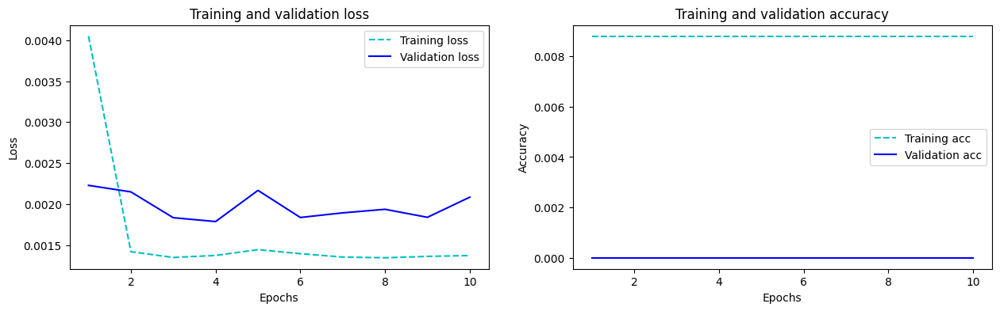

In [43]:
plot_curve(hist_005)

In [44]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.339487,0.338920
1,2021-12-16 09:11:00,0.112,0.131673,0.118314
2,2021-12-16 09:12:00,0.116,0.132701,0.119357
3,2021-12-16 09:13:00,0.112,0.136802,0.123520
4,2021-12-16 09:14:00,0.099,0.132701,0.119357
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188684,0.176841
289,2021-12-16 13:59:00,0.169,0.188684,0.176841
290,2021-12-16 14:00:00,0.147,0.189659,0.177856
291,2021-12-16 14:01:00,0.145,0.168025,0.155457


In [45]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [46]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.002076


In [47]:
mse_error_unit_50_005 = [lstm_mse_error_unit_50_005]
mse_data.loc['Lstm mse error learning rate 0.05'] = mse_error_unit_50_005

----------------------------------------------------------------------------------

### lr 0.01

### Add frist layer: units = 50

In [54]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error', metrics=['accuracy'])
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 5ms/step - loss: 0.0062 - accuracy: 0.0087 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0020 - val

Last train loss: 0.0012127909576520324
Last validation loss: 0.0018369838362559676
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


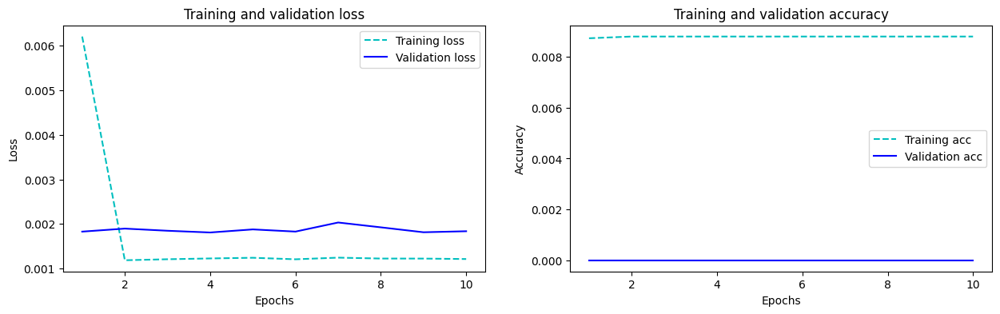

In [55]:
plot_curve(hist_001)

In [56]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.339487,0.338920,0.325014
1,2021-12-16 09:11:00,0.112,0.131673,0.118314,0.108155
2,2021-12-16 09:12:00,0.116,0.132701,0.119357,0.109145
3,2021-12-16 09:13:00,0.112,0.136802,0.123520,0.113106
4,2021-12-16 09:14:00,0.099,0.132701,0.119357,0.109145
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188684,0.176841,0.164735
289,2021-12-16 13:59:00,0.169,0.188684,0.176841,0.164735
290,2021-12-16 14:00:00,0.147,0.189659,0.177856,0.165730
291,2021-12-16 14:01:00,0.145,0.168025,0.155457,0.143854


In [57]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [58]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001828


In [59]:
mse_error_unit_50_001 = [lstm_mse_error_001]
mse_data.loc['Lstm mse error learning rate 0.01'] = mse_error_unit_50_001

----------------------------------------------------------------------------------

### lr 0.005

### Add frist layer: units = 50

In [60]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error', metrics=['accuracy'])
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 6ms/step - loss: 0.0124 - accuracy: 0.0085 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0011918791569769382
Last validation loss: 0.001801160047762096
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


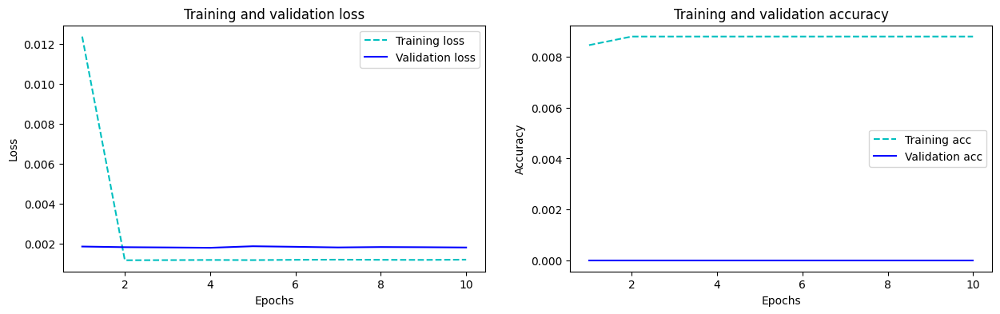

In [61]:
plot_curve(hist_0005)

In [62]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.339487,0.338920,0.325014,0.322741
1,2021-12-16 09:11:00,0.112,0.131673,0.118314,0.108155,0.109259
2,2021-12-16 09:12:00,0.116,0.132701,0.119357,0.109145,0.110237
3,2021-12-16 09:13:00,0.112,0.136802,0.123520,0.113106,0.114148
4,2021-12-16 09:14:00,0.099,0.132701,0.119357,0.109145,0.110237
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188684,0.176841,0.164735,0.165097
289,2021-12-16 13:59:00,0.169,0.188684,0.176841,0.164735,0.165097
290,2021-12-16 14:00:00,0.147,0.189659,0.177856,0.165730,0.166079
291,2021-12-16 14:01:00,0.145,0.168025,0.155457,0.143854,0.144500


In [63]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [64]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001792


In [65]:
mse_error_unit_50_0005 = [lstm_mse_error_unit_50_0005]
mse_data.loc['Lstm mse error learning rate 0.005'] = mse_error_unit_50_0005

----------------------------------------------------------------------------------

lr 0.001

### Add frist layer: units = 50

In [66]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error', metrics=['accuracy'])
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 5s 4ms/step - loss: 0.0527 - accuracy: 0.0071 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 1s 3ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.001138579100370407
Last validation loss: 0.0018121077446267009
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


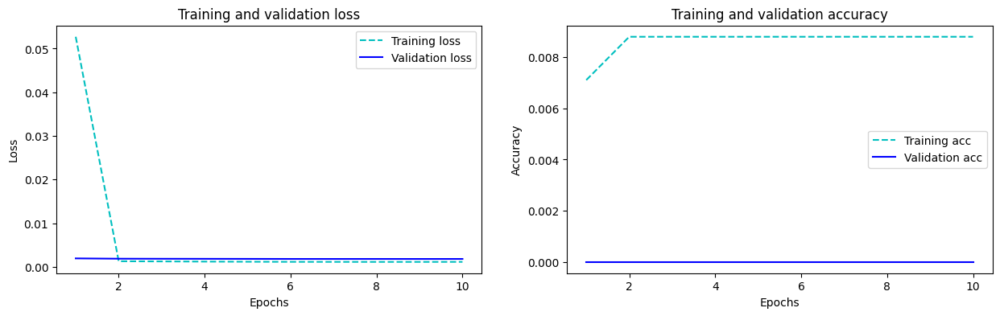

In [67]:
plot_curve(hist_0001)

In [68]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.339487,0.338920,0.325014,0.322741,0.325014
1,2021-12-16 09:11:00,0.112,0.131673,0.118314,0.108155,0.109259,0.108155
2,2021-12-16 09:12:00,0.116,0.132701,0.119357,0.109145,0.110237,0.109145
3,2021-12-16 09:13:00,0.112,0.136802,0.123520,0.113106,0.114148,0.113106
4,2021-12-16 09:14:00,0.099,0.132701,0.119357,0.109145,0.110237,0.109145
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.188684,0.176841,0.164735,0.165097,0.164735
289,2021-12-16 13:59:00,0.169,0.188684,0.176841,0.164735,0.165097,0.164735
290,2021-12-16 14:00:00,0.147,0.189659,0.177856,0.165730,0.166079,0.165730
291,2021-12-16 14:01:00,0.145,0.168025,0.155457,0.143854,0.144500,0.143854


In [69]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [70]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_0001)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001828


In [71]:
mse_error_unit_50_0001 = [lstm_mse_error_0001]
mse_data.loc['Lstm mse error learning rate 0.001'] = mse_error_unit_50_0001

----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [144]:
test3 = test.copy()

In [145]:
test3['LSTM_50'] = predict_adam

In [146]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 6ms/step - loss: 0.0366 - accuracy: 0.0077 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.001139719388447702
Last validation loss: 0.0018111416138708591
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


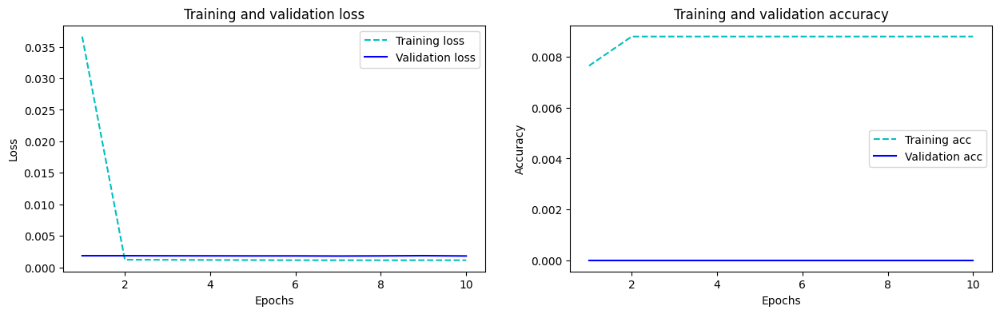

In [147]:
plot_curve(hist_1)

In [148]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.326649,0.328860
1,2021-12-16 09:11:00,0.112,0.114095,0.114083
2,2021-12-16 09:12:00,0.116,0.115065,0.115067
3,2021-12-16 09:13:00,0.112,0.118946,0.119005
4,2021-12-16 09:14:00,0.099,0.115065,0.115067
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.170283
289,2021-12-16 13:59:00,0.169,0.169542,0.170283
290,2021-12-16 14:00:00,0.147,0.170517,0.171271
291,2021-12-16 14:01:00,0.145,0.149077,0.149557


In [149]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [150]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_100)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001802


In [151]:
mse_error_unit_100 = [lstm_mse_error_unit_100]
mse_data.loc['Lstm mse error frist layer unit 100'] = mse_error_unit_100

------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [152]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 6ms/step - loss: 0.0389 - accuracy: 0.0074 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0023 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 2s 4ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 2s 3ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0017192428931593895
Last validation loss: 0.0018003273289650679
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


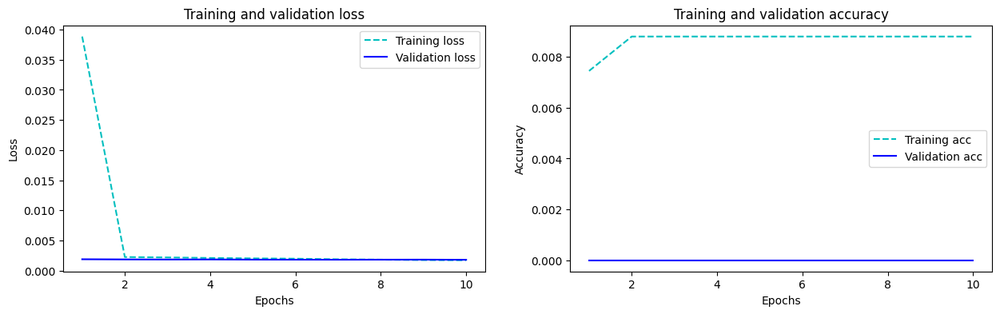

In [153]:
plot_curve(hist_2)

In [154]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.326649,0.328860,0.325775
1,2021-12-16 09:11:00,0.112,0.114095,0.114083,0.114493
2,2021-12-16 09:12:00,0.116,0.115065,0.115067,0.115457
3,2021-12-16 09:13:00,0.112,0.118946,0.119005,0.119312
4,2021-12-16 09:14:00,0.099,0.115065,0.115067,0.115457
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.170283,0.169576
289,2021-12-16 13:59:00,0.169,0.169542,0.170283,0.169576
290,2021-12-16 14:00:00,0.147,0.170517,0.171271,0.170546
291,2021-12-16 14:01:00,0.145,0.149077,0.149557,0.149244


In [156]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [157]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001791


In [158]:
mse_error_50_drop_out = [lstm_mse_error_50_drop_out]
mse_data.loc['Lstm mse error frist layer unit 50 drop out 0.1'] = lstm_mse_error_50_drop_out


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [159]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 11s 10ms/step - loss: 0.0268 - accuracy: 0.0083 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 5ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0011 - accuracy: 0.0088 - val_loss: 0.0018 - v

Last train loss: 0.001164354500360787
Last validation loss: 0.0018041299190372229
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


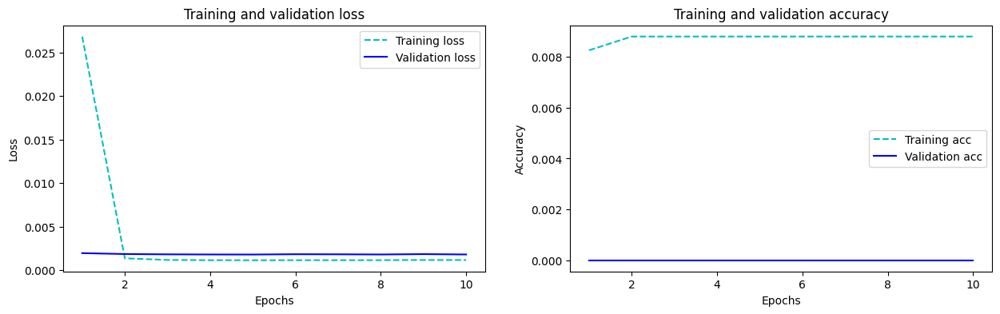

In [160]:
plot_curve(hist_3)

In [161]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.326649,0.328860,0.325775,0.327657
1,2021-12-16 09:11:00,0.112,0.114095,0.114083,0.114493,0.113680
2,2021-12-16 09:12:00,0.116,0.115065,0.115067,0.115457,0.114654
3,2021-12-16 09:13:00,0.112,0.118946,0.119005,0.119312,0.118553
4,2021-12-16 09:14:00,0.099,0.115065,0.115067,0.115457,0.114654
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.170283,0.169576,0.169419
289,2021-12-16 13:59:00,0.169,0.169542,0.170283,0.169576,0.169419
290,2021-12-16 14:00:00,0.147,0.170517,0.171271,0.170546,0.170400
291,2021-12-16 14:01:00,0.145,0.149077,0.149557,0.149244,0.148838


In [162]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [163]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_second_layer)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001795


In [164]:
mse_error_second_layer = [lstm_mse_error_second_layer]
mse_data.loc['Lstm mse error second_layer 50'] = mse_error_second_layer 

---

### Add frist layer: units = 50 and Add second layer: unit = 100

In [181]:
model_4 = Sequential()
model_4.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_4.add(LSTM(units = 100))
model_4.add(Dense(units = 1))
model_4.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 17s 10ms/step - loss: 0.0262 - accuracy: 0.0080 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - 

Last train loss: 0.0011655458947643638
Last validation loss: 0.0018268235726282
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


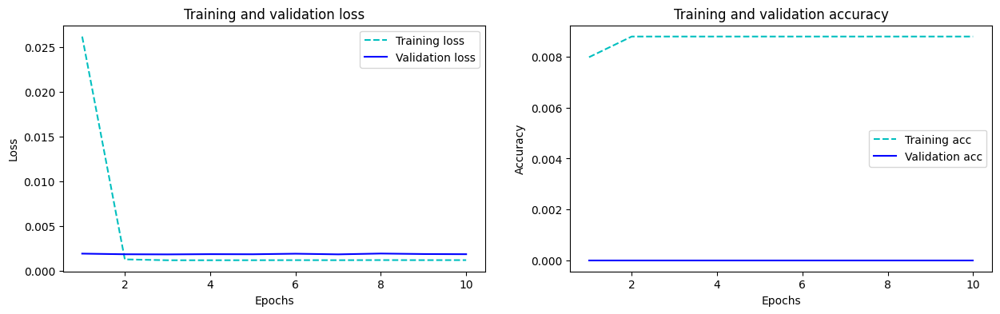

In [182]:
plot_curve(hist_4)

In [183]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_second_layer_100'] = predict_4
test3

10/10 [==============================] - 2s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30
0,2021-12-16 09:10:00,0.111,0.326649,0.328860,0.325775,0.327657,0.328981,0.324369
1,2021-12-16 09:11:00,0.112,0.114095,0.114083,0.114493,0.113680,0.111621,0.109198
2,2021-12-16 09:12:00,0.116,0.115065,0.115067,0.115457,0.114654,0.112615,0.110180
3,2021-12-16 09:13:00,0.112,0.118946,0.119005,0.119312,0.118553,0.116591,0.114111
4,2021-12-16 09:14:00,0.099,0.115065,0.115067,0.115457,0.114654,0.112615,0.110180
...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.170283,0.169576,0.169419,0.168401,0.165348
289,2021-12-16 13:59:00,0.169,0.169542,0.170283,0.169576,0.169419,0.168401,0.165348
290,2021-12-16 14:00:00,0.147,0.170517,0.171271,0.170546,0.170400,0.169400,0.166336
291,2021-12-16 14:01:00,0.145,0.149077,0.149557,0.149244,0.148838,0.147451,0.144625


In [184]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [185]:
lstm_mse_error_second_layer_unit100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_second_layer_unit100)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001818


In [186]:
mse_error_second_layer_unit100 = [lstm_mse_error_second_layer_unit100]
mse_data.loc['Lstm mse error second layer 100'] = mse_error_second_layer_unit100 

---

### Add frist layer: units = 50 and change epochs from 10 to 30

In [171]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['accuracy'])
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
462/462 [==============================] - 6s 6ms/step - loss: 0.0471 - accuracy: 0.0075 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 2/30
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/30
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/30
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/30
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/30
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/30
462/462 [==============================] - 2s 4ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0011335867457091808
Last validation loss: 0.0018125217175111175
Last train accuracy: 0.00880341324955225
Last validation accuracy: 0.0


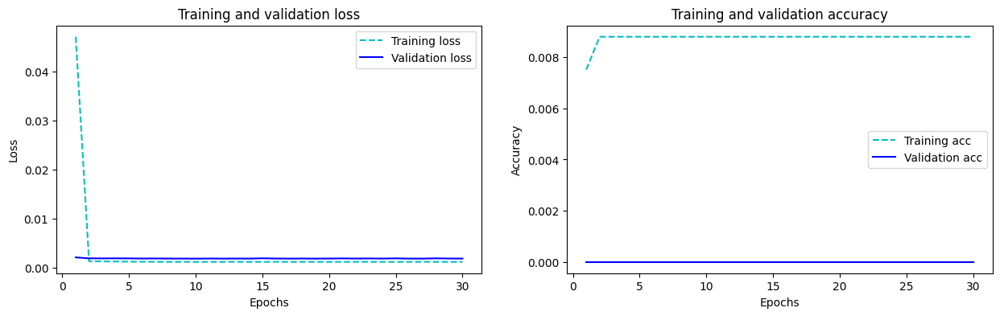

In [172]:
plot_curve(hist_5)

In [173]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch30'] = predict_5
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30
0,2021-12-16 09:10:00,0.111,0.326649,0.328860,0.325775,0.327657,0.324290,0.324369
1,2021-12-16 09:11:00,0.112,0.114095,0.114083,0.114493,0.113680,0.109681,0.109198
2,2021-12-16 09:12:00,0.116,0.115065,0.115067,0.115457,0.114654,0.110657,0.110180
3,2021-12-16 09:13:00,0.112,0.118946,0.119005,0.119312,0.118553,0.114562,0.114111
4,2021-12-16 09:14:00,0.099,0.115065,0.115067,0.115457,0.114654,0.110657,0.110180
...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169542,0.170283,0.169576,0.169419,0.165537,0.165348
289,2021-12-16 13:59:00,0.169,0.169542,0.170283,0.169576,0.169419,0.165537,0.165348
290,2021-12-16 14:00:00,0.147,0.170517,0.171271,0.170546,0.170400,0.166521,0.166336
291,2021-12-16 14:01:00,0.145,0.149077,0.149557,0.149244,0.148838,0.144907,0.144625


In [174]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [175]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_epoch30)

Better MSE value is :  0.0017871748422507152


,Model,MSE error
0,model,0.001787
1,model_1,0.001803


In [187]:
mse_error_epoch30 = [lstm_mse_error_unit_50_epoch30]
mse_data.loc['Lstm mse error epoch 30'] = mse_error_epoch30


In [188]:
mse_data

,LSTM lag1
Lstm mse error unit 50 adam,0.001787
Lstm mse error unit 50 sgd,0.001811
Lstm mse error unit 50 rmsprop,0.001818
Lstm mse error batch_size64,0.001813
Lstm mse error learning rate 0.1,0.002110
Lstm mse error learning rate 0.05,0.002076
Lstm mse error learning rate 0.01,0.001828
Lstm mse error learning rate 0.005,0.001792
Lstm mse error learning rate 0.001,0.001828
Lstm mse error frist layer unit 100,0.001802


In [189]:
minimum_mse= mse_data.loc[mse_data['LSTM lag1'].idxmin()]
minimum_mse

LSTM lag1    0.001787
Name: Lstm mse error unit 50 adam, dtype: float64

In [179]:
mse_data.to_csv('data_lstm_mse.csv')

In [180]:
model_50_adam.save('model_50_adam_lag1.h5')